# Surface Event Pick Time

This is a modified version of the surface-event location+directivity analysis that Francesca Skene ( fskene@uw.edu), originally created by her in 7/22/22, who started as an undergraduate student at UW. This is marine denolle's version. It includes:
* Waveform download for each event on each volcano given the PNSN pick times of "su" events.
* Data pre-processing to trim the data within 2-12 Hz and remove outliers.
* phase picking using transfer-learned model (Ni et al, 2023)
* event location using 1D grid search
* directivity measurements (velocity and direction) using Doppler effects.
* gathering of the data into a CSV data frame.

Updated 02/1/2024
Marine Denolle
(mdenolle@uw.edu)

Import Modules

In [1]:
# import sys
# sys.path.append('/data/wsd01/pnwstore/')
import matplotlib.pyplot as plt

import h5py
import numpy as np
import pandas as pd
import obspy
from obspy.core import UTCDateTime
from obspy.clients.fdsn.client import Client

import scipy
from scipy import optimize
from scipy.optimize import curve_fit
from datetime import datetime
from utils import *
from mbf_elep_func import *
import torch
plt.rcParams.update({'font.size': 10})


import seisbench.models as sbm
device = torch.device("cpu") #torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# from ELEP.elep.ensemble_statistics import ensemble_statistics
from ELEP.elep.ensemble_coherence import ensemble_semblance 
# from ELEP.elep.ensemble_learners import ensemble_regressor_cnn
from ELEP.elep import mbf, mbf_utils
from ELEP.elep import trigger_func

from ELEP.elep.mbf_utils import make_LogFq, make_LinFq, rec_filter_coeff, create_obspy_trace
from ELEP.elep.mbf import MB_filter as MBF

from joblib import Parallel, delayed
from matplotlib.backends.backend_pdf import PdfPages
import pyproj

What avalanche are we studying?

In [2]:
ava = 'Avalanche_12102023'

Parameters

In [3]:
# define clients to download the station data
# client = WaveformClient() # we ignore PNWdatastore for now
client2 = Client('IRIS') # IRIS client

t_before = 15 #number of seconds before pick time
# t_after = 15 #number of seconds after pick time
t_before_raw = 1200 #number of seconds before pick time before removing instrumental response
# t_after_raw = 1200 #number of seconds after pick time before removing instrumental response
fs = 40 #sampling rate that all waveforms are resampled to
window = 150 #window length of the signal (this will help with phase picking with EqT next). 
# Use 150 seconds @ 40 Hz gives 6001 points. 
pr = 98 #percentile
thr = 7 #SNR threshold
station_distance_threshold = 25
pi = np.pi
vs = 2800 #shear wave velocity at the surface

# range of dates that we are looking at
t_beginning = UTCDateTime(2001,1,1,0,0,0) 
t_end = UTCDateTime(2024,1,1,23,59)

smooth_length = 20 # constant for smoothing the waveform envelopes
low_cut = 1 #low frequency threshold
high_cut = 15 #high frequency threshold
az_thr = 1000 #threshold of distance in meters from source location
step = 100 #step every 100 m
t_step = 1 #step every second
ratio = 5.6915196 #used to define the grid 
# colors = list(plt.cm.tab10(np.arange(10)))*3
radius = 6371e3 # radius of the earth

## Volcano - Station Information

In [4]:
#this data includes all stations within 50km of each volcano and the lat, lon, elev of each station
df = pd.read_csv('../data/station/Volcano_Metadata_50km.csv')

## PNSN SU Pick information

In [5]:
# f1 = pd.read_csv("../data/events/su_picks.txt",sep="|")
# f1.head()
# print(f1.keys())

In [6]:
# # clean up the spaces in the file
# format='%Y/%m/%d %H:%M:%S'
# test=f1["date"].values.tolist()
# start_time_temp = [  datetime.strptime(x.strip(),'%Y/%m/%d %H:%M:%S') for x in f1["date"].values.tolist()]
# # # Ignore events prior to t_beginning
# ik=np.where(np.array(start_time_temp)>datetime(2001,1,1))[0][0]

# # select only net, sta, evid, startime for event past the start date.

# start_time = start_time_temp[ik:]
# net=[ x.strip() for x in f1["net"].values.tolist()][ik:]
# sta=[ x.strip() for x in f1["sta"].values.tolist()][ik:]
# evt_id=[ x for x in f1["orid"].values.tolist()][ik:]
# all_stas=set(sta)

## ML Models

In [7]:
# import os
# os.makedirs("/Users/marinedenolle/.seisbench/models/v3/eqtransformer",exist_ok=True)

In [8]:
# !wget https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/pnw.pt.v1 -O ~/.seisbench/models/v3/eqtransformer/pnw.pt.v1
# !wget https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/pnw.json.v1 -O ~/.seisbench/models/v3/eqtransformer/pnw.json.v1

In [9]:
# download models
list_models_name = ["pnw","ethz","instance","scedc","stead","geofon"]
pn_pnw_model = sbm.EQTransformer.from_pretrained('pnw')
pn_ethz_model = sbm.EQTransformer.from_pretrained("ethz")
pn_instance_model = sbm.EQTransformer.from_pretrained("instance")
pn_scedc_model = sbm.EQTransformer.from_pretrained("scedc")
pn_stead_model = sbm.EQTransformer.from_pretrained("stead")
pn_geofon_model = sbm.EQTransformer.from_pretrained("geofon")
# pn_neic_model = sbm.EQTransformer.from_pretrained("neic")

list_models = [pn_pnw_model, pn_ethz_model, pn_instance_model, pn_scedc_model, pn_stead_model, pn_geofon_model]

pn_pnw_model.to(device);
pn_ethz_model.to(device);
pn_scedc_model.to(device);
# pn_neic_model.to(device);
pn_geofon_model.to(device);
pn_stead_model.to(device);
pn_instance_model.to(device);

In [10]:
paras_semblance = {'dt':0.025, 'semblance_order':4, 'window_flag':True, 
                   'semblance_win':0.5, 'weight_flag':'max'}
p_thrd, s_thrd = 0.01, 0.05

fqmin = low_cut
fqmax = high_cut
dt = 0.025; fs = 40
nfqs = 10
nt = 6000; nc = 3
fq_list = make_LogFq(fqmin, fqmax, dt, nfqs)
coeff_HP, coeff_LP = rec_filter_coeff(fq_list, dt)
MBF_paras = {'f_min':fqmin, 'f_max':fqmax, 'nfqs':nfqs, 'frequencies':fq_list, 'CN_HP':coeff_HP, 'CN_LP':coeff_LP, \
    'dt':dt, 'fs':fs, 'nt':nt, 'nc':nc, 'npoles': 2}

# Full stack:

* download waveforms
* phase pick onset
* estimate SNR
* measure centroid, max envelope, duration
* measure Fmax for doppler analysis


In [7]:
with h5py.File('/Users/marinedenolle/Downloads/Avalanche_2023-12-10_19.00_1min.h5', "r") as f:
    data = f["/Acquisition/Raw[0]/RawData"][:, :]
    starttime = f["/Acquisition/Raw[0]/RawDataTime"][0] / 1e6
stream = obspy.Stream([])
for i in range(data.shape[1]):
    trace = obspy.Trace(data)
    trace.stats.network = 'BC'
    trace.stats.station = 'chan.station.name'
    trace.stats.channel = i
    trace.stats.sampling_rate = 200
    trace.stats.starttime = UTCDateTime(2023,12,10,19,00)  # no need to fill end time: read only
    stream += obspy.Stream([trace])
print(stream)

PermissionError: [Errno 1] Unable to open file (unable to open file: name = '/Users/marinedenolle/Downloads/Avalanche_2023-12-10_19.00_1min.h5', errno = 1, error message = 'Operation not permitted', flags = 0, o_flags = 0)

In [6]:
print(h5py.__version__)

3.9.0


snr 20.385755126475765
ARAT 40.525 73.93419402737263
snr 1.6690473922930364
snr 1.5220479986090767
snr 0.09656497222121552
snr 13.015297344899194
OBSR 39.35 71.86981085562702
snr 4.783478101370481
snr 25.845379478920076
PANH 37.825 75.47713852805155
snr 29.70141579847783
PARA 36.775 78.37906620354065
snr 0.3400121599666387
snr -0.01907739771730715
snr -0.03900323788156834
snr 7.04511927502467
PR04 41.125 73.59691573880457
snr 10.672576753262108
PR05 40.225 72.26552312563392
snr 11.981717327195557
RUSH 41.375 72.61820321641152
snr 9.802825702971614
SIFT 40.475 75.31383632294849
snr 1.5015638026185207
snr -0.6663673675575462
snr 6.109822741480572
snr 0.3546432318091509
snr -0.007983939386236554
snr -0.6552727051661213
snr 18.11630825556993
LO2 46.725 77.54929687113632
snr 0.7806348646206757
snr 18.14370355595552
LON 46.65 77.52189100597838
snr 1.951691917233604
snr -2.345513329394601
snr 30.550353379704333
RCM 38.3 72.65320577374098
snr 25.346498799732114
RCS 39.175 67.94199428824098
snr

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


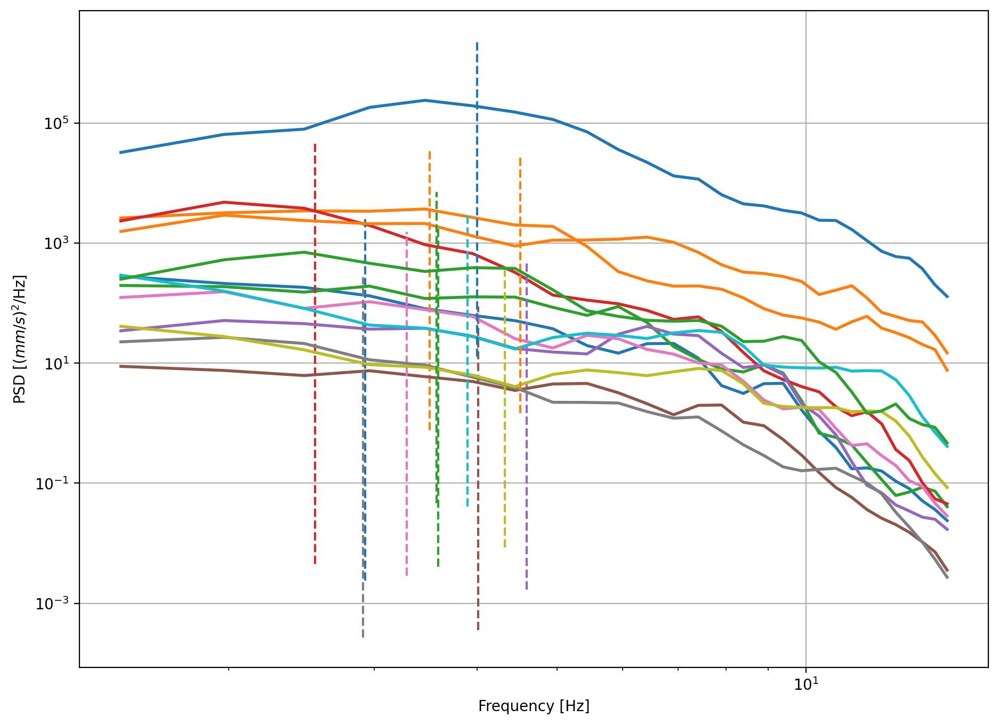

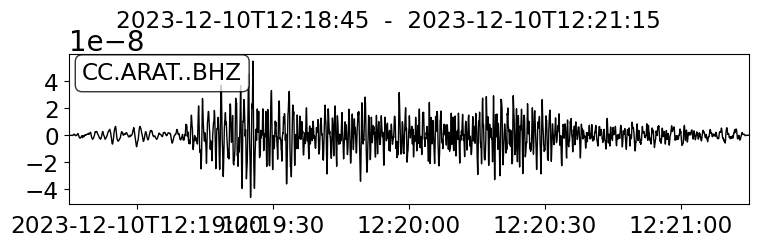

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


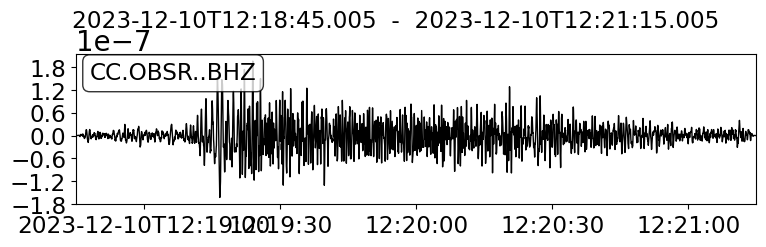

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


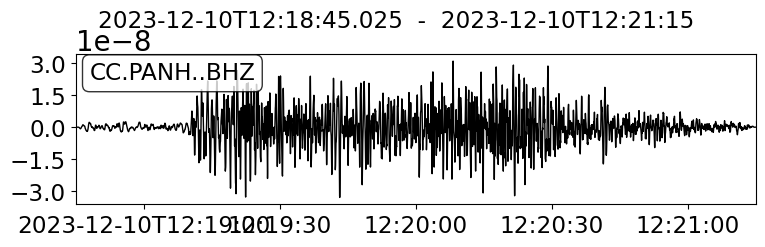

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


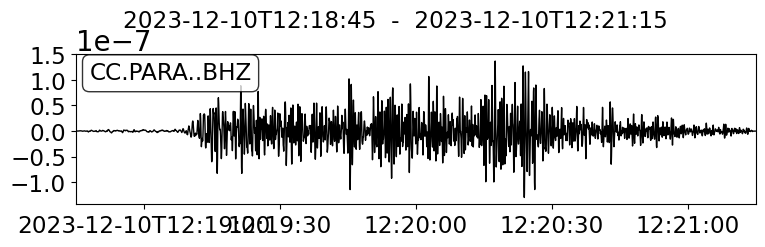

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


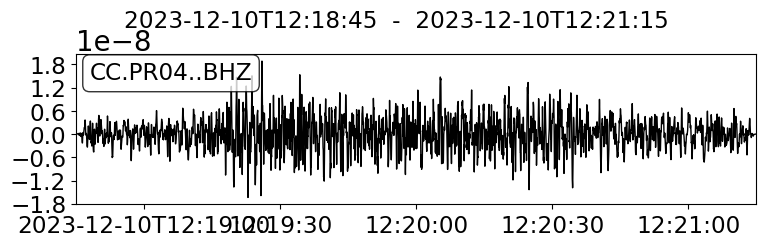

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


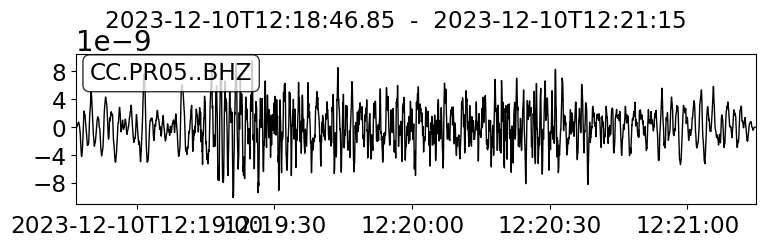

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


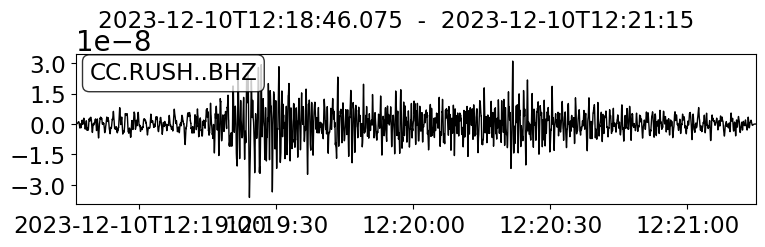

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's i

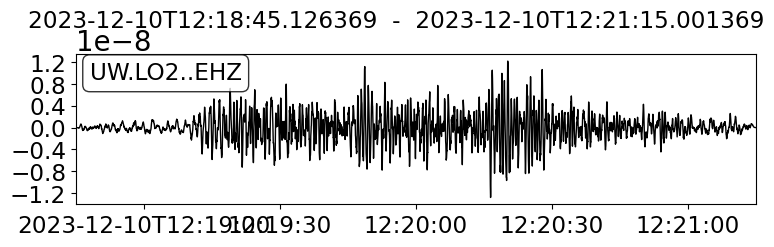

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


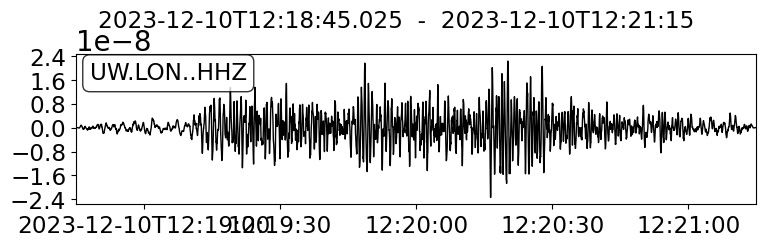

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


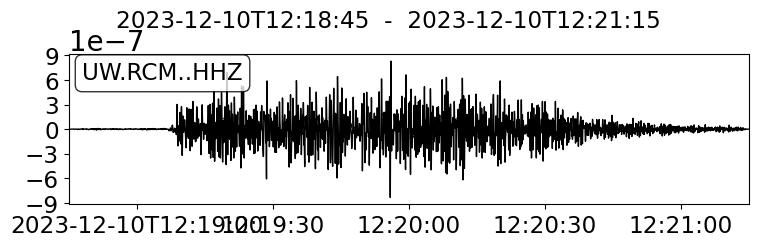

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


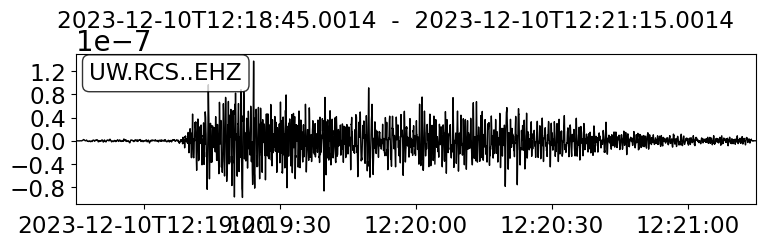

/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/marinedenolle/opt/miniconda3/envs/seismo_exo/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


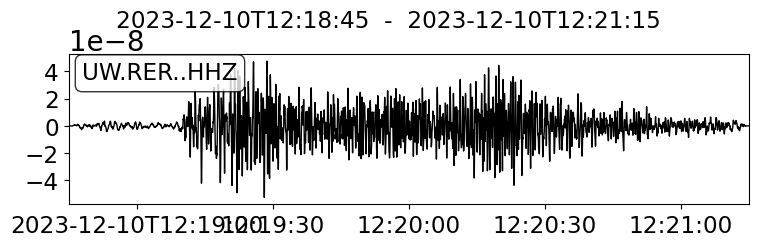

NameError: name 'max_env' is not defined

In [11]:

pdf = PdfPages('../plots/'+ava+'.pdf')
associated_volcano = "Mt_Rainier"
dff=[] 
event_ID = '0000' #str(evt_id[n])
otime = UTCDateTime(2023,12,10,12,19)
associated_volcano="Mt_Rainier"


#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()


#################### WAVEFORM DOWNLOAD #######################
#Download all waveforms for that event based on stations and times
bulk = [] 
for m in range(0, len(networks)):
    bulk.append([networks[m], stations[m], '*', '*Z', otime-t_before_raw, otime+t_before_raw])
# try:
st = client2.get_waveforms_bulk(bulk)
st = resample(st,fs)  #resampling the data to 40Hz for each trace


with h5py.File('~/Downloads/Avalanche_2023-12-10-19.00_1min.h5', "r") as f:
            data = f["/Acquisition/Raw[0]/RawData"][:, :]
            starttime = f["/Acquisition/Raw[0]/RawDataTime"][0] / 1e6
            stream = obspy.Stream([])
            for i in range(data.shape[1]):
                trace = obspy.Trace(data)
                trace.stats.network = 'BC'
                trace.stats.station = 'chan.station.name'
                trace.stats.channel = i
                trace.stats.sampling_rate = 200
                trace.stats.starttime = UTCDateTime(2023,12,10,19,00)  # no need to fill end time: read only
                stream += obspy.Stream([trace])
            print(stream)

evt_data = obspy.Stream()
snr=[]
stas=[]
nets=[]
lats=[]
lons=[]
els=[]
centroid_time = []
data_env_dict = {}
duration = []
max_time = []

# #Keeping all traces for one event with channel z, SNR>10, and bandpassed between 2-12Hz
# ,nets,max_amp_times,durations,data_env_dict,t_diff = [],[],[],[],[],[],[],{},{}
for i,ii in enumerate(st):
    ii.detrend(type = 'demean')
    ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut,corners=2,zerophase=True)
    # trim the data and noise window to exactly 6000 points
    signal_window = ii.copy()
    noise_window = ii.copy()
    signal_window.trim(otime - t_before, otime - t_before + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
    noise_window.trim(otime - window -t_before, otime - t_before) # noise window of the same length
    if  len(signal_window.data)<=10 or  len(noise_window.data)<=10: continue # skip if no data
    # if not np.percentile(np.abs(signal_window.data),pr):continue # skip if max amplitude is zero
    snr1 = (20 * np.log(np.percentile(np.abs(signal_window.data),pr) 
                    / np.percentile(np.abs(noise_window.data),pr))/np.log(10))
    print("snr",snr1)
    if snr1<thr: # and 100<max_amp_time<200:
        st.remove(ii)
        continue

################# ENVELOPE, CENTROID, DURATION #######################
    # enveloping the data 
    data_envelope = obspy.signal.filter.envelope(signal_window.data)
    data_envelope = obspy.signal.util.smooth(data_envelope, smooth_length)

    data_env_dict[ii.stats.network+'.'+ii.stats.station]= data_envelope/max(np.abs(data_envelope))


    # max time
    # finding the time of max amplitude of each event
    # signal_window is windowed at otime-t_v before the PNSN pick time
    crap = np.argmax(np.abs(data_envelope[:(t_before+40)*fs])) # time of max amplitude relative to otime
    max_time.append(crap/fs)

    # centroid time
    tcrap = signal_window.times()
    it = np.where(tcrap>0)[0]
    centroid_time.append(np.sum(data_envelope*tcrap)/np.sum(data_envelope))
    print(ii.stats.station,max_time[-1],centroid_time[-1])

    # find duration as data starting with the "origin time" and ending when the envelope falls below the mean noise
    noise_envelope = obspy.signal.filter.envelope(noise_window.data)
    data_envelope = obspy.signal.util.smooth(data_envelope, smooth_length)
    mean_noise = np.mean(noise_envelope)
    
    mmax = np.max(np.cumsum(data_envelope**4))
    crap = np.where( np.cumsum(data_envelope**4) <= 0.999*mmax)[0][-1]
    duration.append(crap/fs)


    stas.append(ii.stats.station)
    nets.append(ii.stats.network)
    ista=stations.index(ii.stats.station)
    lats.append(latitudes[ista])
    lons.append(longitudes[ista])
    els.append(elevations[ista])
    snr.append(snr1)
    evt_data.append(signal_window)

    t = evt_data.select(station=stas[-1])[0].times()
    

centroid_time = np.asarray(centroid_time)
centroid_time -= t_before
max_time = np.asarray(max_time)
max_time -= t_before
duration = np.asarray(duration)
duration -= t_before

################### ELEP #######################

    # test the new function
smb_peak= apply_elep(evt_data, stas, \
        list_models, MBF_paras, paras_semblance, t_before)
smb_peak -= t_before


############## PEAK FREQUENCY MEASUREMENTS ############
# Given the approximate measurement of duration, window the signal windows around that
# then measure peak frequency so that there is less noise in it.
# perform this on the Z component only.

char_freq, sharp_weight= [],[]
fig,ax = plt.subplots(1,1,figsize=(11,8), dpi = 200)
for ii,i in enumerate(evt_data):
    data = np.zeros(200*fs)
    crap=i.copy()
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 2*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)

    data[:len(crap.data)] = crap.data #*100
    f,psd=scipy.signal.welch(data,fs=fs,nperseg=81,noverlap=4)
    #just get the frequencies within the filter band
    above_low_cut = [f>low_cut]
    below_high_cut = [f<high_cut]
    in_band = np.logical_and(above_low_cut,below_high_cut)[0]
    f = f[in_band]
    psd = psd[in_band]

    # calculate characteristic frequency and report
    char_freq_max = f[np.argmax(psd)]
    char_freq_mean= np.sum(psd*f)/np.sum(psd)
    psd_cumsum = np.cumsum(psd)
    psd_sum = np.sum(psd)
    char_freq_median = f[np.argmin(np.abs(psd_cumsum-psd_sum/2))]
    char_freq.append(char_freq_mean)

    plt.rcParams.update({'font.size': 20})
    p=ax.plot(f,psd,label=stas[ii],linewidth=2)
    cc = p[0].get_color()
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid('True')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('PSD [$(mm/s)^2$/Hz]')
    ax.vlines(char_freq_mean,ymin=np.min(psd)/10,ymax=np.max(psd)*10,linestyle="--",colors=cc)
    ax.grid(True)

#             # weighting the data by the spikiness of the PSD vs frequency graphs
    ratio = (np.mean(psd)/np.max(psd))
    sharp_weight.append(int(1/(ratio**2)*20))



##################### get amplitude and energy ###########
MaxD=[];MaxEnv=[];Er=[]
for ii,i in enumerate(evt_data):
    data = np.zeros(200*fs)
    crap=i.copy()

    # get response
    inv = client2.get_stations(network=crap.stats.network, station=crap.stats.station,
                          location=crap.stats.location, channel=crap.stats.channel,
                          level="response", starttime=crap.stats.starttime, endtime=crap.stats.endtime)
    
    # The instrument sensitivity (gain) is stored in the response object
    channel = inv[0][0][0]
    response = channel.response
    gain = response.instrument_sensitivity.value 
    # remove response
    crap.remove_response(inventory=inv,output="DISP")
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 1.5*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)
    crap.plot()


    data_envelope = obspy.signal.filter.envelope(crap.data)
    data_envelope = obspy.signal.util.smooth(crap, smooth_length)

    MaxD.append(np.max(np.abs(crap.data)))
    MaxEnv.append(np.max(np.abs(data_envelope)))


    ## get energy
    crap=i.copy()
    crap.remove_response(inventory=inv,output="VEL")
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 1.5*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)
    Er.append(np.sum(crap.data**2)*crap.stats.sampling_rate)



    ############# KEEP DATA #######################

#         if not max(smb_peak.shape):continue
ddict = {'otime':otime, 'nets':nets, 'stas':stas,  'snr':snr, 'smb_peak': smb_peak, 'max_time':max_time, 'centroid_time': centroid_time , \
         'lats':lats, 'lons':lons, 'elevs':els, 'char_freq':char_freq, 'duration':duration, \
            'sharp_weight':sharp_weight, 'volcano':associated_volcano, 'event_ID':event_ID, \
                'MaxD':MaxD,'MaxEnv':MaxEnv,'ER':Er}
if not np.any(dff):
    dff = pd.DataFrame.from_dict(ddict)
else:
    dff=pd.concat([dff,pd.DataFrame.from_dict(ddict)],ignore_index=True)
print(dff)


fig = plt.figure(figsize = (11,8), dpi=400)
fig.suptitle(str(otime)+" "+associated_volcano)
ax = plt.subplot(1,1,1)
iplot = 0
for i in range(len(stas)):
    data = evt_data.select(station=stas[i])[0].data
    max1 = np.max(np.abs(data))
    t = evt_data.select(station=stas[i])[0].times()
    ax.plot(t-t_before,data/max1+iplot*1.5,linewidth=0.5)
    if np.any(data_env_dict[nets[i]+'.'+stas[i]]):
        ax.plot(t-t_before,data_env_dict[nets[i]+'.'+stas[i]]+iplot*1.5,'k',linewidth=1)
    ax.plot(smb_peak[i],iplot*1.5,'r*',markersize=5)  
    ax.plot(centroid_time[i],iplot*1.5,'k*',markersize=5)  
    ax.plot(max_time[i],iplot*1.5,'r*',markersize=5)  
    ax.set_yticks([])
    plt.text(-15, iplot*1.5+0.5, stas[i])
    print(stas[i],snr[i])
    # if i==ista:
    # err_title=("%s %2.2f (s) error in picks"%(stas[i],smb_peak[i]-t_before))
    # plt.text(60, iplot*1.5+0.5,err_title,color='r')
    plt.vlines(smb_peak[i],iplot*1.5-1.,iplot*1.5+1.,'r')
    print(duration[i],char_freq[i],sharp_weight[i])
    # print(stas[i],smb_peak[i]-t_before)
    iplot+=1
# plt.grid(True)
ax.set_xlim([-t_before,130])
ax.set_xlabel('Time (s) since 12:19 ')
plt.show()
plt.savefig("../plots/" + ava + "_waveforms.png")
plt.clf()
# del fig
pdf.close()
dff.to_csv("../data/events/MLPicks_" + ava +".csv")

## DAS data

Now pick the DAS.

## Event location

### Volcano data



In [ ]:

associated_volcano == 'Mt_Rainier'
        
#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()

############ LOCATION ############################
# input necessary data for grid search
arrivals = dff['smb_peak'].values
# arrivals = dff[dff['event_ID']==event_ID]['smb_peak'].values
sta_lats = dff['lats'].values
sta_lons = dff['lons'].values


Text(0.5, 1.0, 'Travel time Relative to RCM')

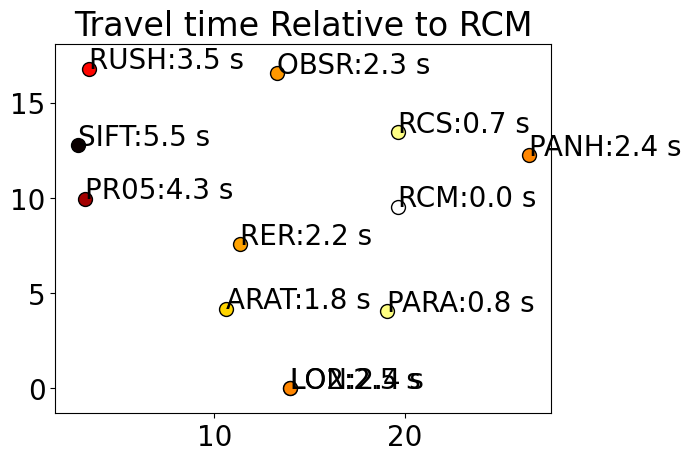

In [ ]:
import pyproj


# Define the projection: UTM zone 11 for Washington state
proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')

# Convert lat/long to Cartesian in meters
xsta, ysta = proj(sta_lons, sta_lats)
new_xsta =( xsta - np.min(xsta))/1E3
new_ysta = (ysta - np.min(ysta))/1E3

cmap = plt.get_cmap('hot_r')
ista=np.where(arrivals>0)[0]
imin = np.argmin(arrivals[ista])
for i in ista:
    tt = arrivals[i]-np.min(arrivals[ista])
    nmax=np.max(arrivals[ista])-np.min(arrivals[ista])
    plt.plot(new_xsta[i],new_ysta[i],'o',color=cmap(tt/nmax),markersize=10,markeredgecolor='k')
    plt.text(new_xsta[i],new_ysta[i],stas[i]+":"+str(np.ceil(tt*10)/10)+" s")
    plt.axis('equal')
plt.title("Travel time Relative to " + dff['stas'].values[ista[imin]])

Now we are confident that we can do the grid search. let's check the other fields

In [ ]:
# center latitude, center longitude, elevation(m), left_trim, right_trim, bottom_trim, top_trim 
volc_lat_lon = {}
volc_lat_lon['Mt_Rainier'] = [46.8528857, -121.7603744, 4392.5]
#Find the lower left corner and grid size based on volcano elevation
# define grid origin in lat,lon and grid dimensions in m
lon_start = -122 #volc_lat_lon[associated_volcano][0]
lon_end = -121.5 #volc_lat_lon[associated_volcano][0]
lat_start = 46.6 #volc_lat_lon[associated_volcano][1]
lat_end = 47 #volc_lat_lon[associated_volcano][1]


proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')
if lon_start<0: 
    lon_start1 = lon_start+360
    lon_end1 = lon_end + 360
# Convert lat/long to Cartesian in meters
x_step=100
x1,y1=proj(lon_start,lat_start)
x2,y2=proj(lon_end,lat_end)
# Generate the x and y coordinates for the grid
x_coords = np.arange(x1, x2, x_step)
y_coords = np.arange(y1, y2, x_step)


cmap1 = plt.get_cmap('hot_r')
cmap2 = plt.get_cmap('hsv')


(array([10]), array([181]), array([256])) (array([10]), array([181]), array([256]))


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/3105442416.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs


[-1.] [-121.75845866] [46.82801658] [594.69088353] [594.69088353]


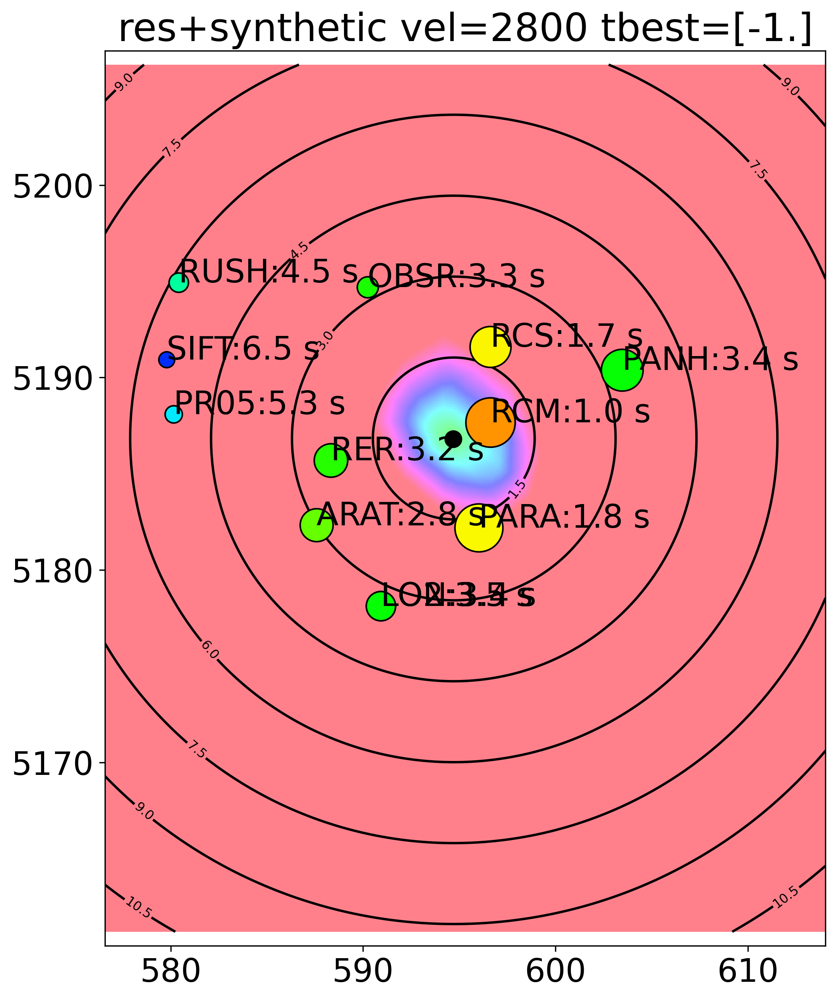

In [ ]:

proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')
ista =np.where(arrivals>-t_before+0.1)[0]
rss_mat,t_best,lon_best,lat_best,x_best,y_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)#,
                                                # weight=dff['snr'].values[ista]**2)

oc_idx = np.unravel_index([np.argmin(rss_mat)], rss_mat.shape)

print(oc_idx,idx_best)

# t_best = t0[oc_idx[0]]
x_best = x_coords[oc_idx[1]]
y_best = y_coords[oc_idx[2]]
xxlon_best, xxlat_best = proj(x_best, y_best, inverse=True)
# # print(vs,t_best,lon_best,lat_best)
# # su_x,su_y=proj(lon_best,lat_best)
synthetic_tt = np.zeros((len(x_coords),len(y_coords)))    
for ii in range(len(x_coords)):
        for jj in range(len(y_coords)):
                synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs  
# Existing imshow plot
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=1,alpha=0.5)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
plt.clabel(contours, inline=True, fontsize=8)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt[0]/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values,markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt[0]*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=10)
plt.title("res+synthetic vel="+str(vs) + ' tbest='+str(t_best))
# # plt.xlim([-122,-121.5]);
plt.savefig("../plots/" + ava+ "_res.png")

# plt.show()
# # lets plot rss_mat to see if we can find the minimum

print(t_best,xxlon_best, xxlat_best ,x_best/1E3 ,x_best/1E3)

## Locate event

In [ ]:
ista =np.where(arrivals>-t_before+0.1)[0]

# origin time


# print(dff['pick'].values[ista])
rss_mat,t_best,lon_best,lat_best,x_best,y_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)
# t_best1 = t_best
# xxlon_best1 = xxlon_best
# xxlat_best1 = xxlat_best 
# x_best1 = x_best 
# y_best1 = y_best

# t_best,lon_best,lat_best,x_best,y_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)#,
                                              # weight=dff['snr'].values[ista]**2)

print(t_best,lon_best,lat_best,x_best,y_best)
# print(t_best1,xxlon_best1,xxlat_best1,x_best1,y_best1)

# max time
print(dff['max_time'].values[ista])

crap,mt_best,mlon_best,mlat_best,mx_best,my_best,midx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],dff['max_time'].values[ista],vs=vs)
# mt_best,mlon_best,mlat_best,xm_best,ym_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],dff['max_time'].values[ista],vs=vs)
print(mt_best,mlon_best,mlat_best)

# centroid time
print(dff['centroid_time'].values[ista])
# ct_best,clon_best,clat_best,xc_best,yc_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],dff['centroid_time'].values[ista],vs=vs)
crap,ct_best,clon_best,clat_best,cx_best,cy_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],dff['centroid_time'].values[ista],vs=vs)

print(ct_best,clon_best,clat_best)

[-1.] [-121.75845866] [46.82801658] [594690.88352976] [5186800.77436475]
[25.525 24.35  22.825 21.775 25.225 26.375 25.475 31.725 31.65  23.3
 24.175 29.125]
grid search failed to converge in the origin time
[-2.] [-121.70370955] [46.9237]
[58.93419403 56.86981086 60.47713853 63.3790662  57.26552313 57.61820322
 60.31383632 62.54929687 62.52189101 57.65320577 52.94199429 59.40549324]
[-0.1] [-121.82957911] [46.99434809]


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/4220735733.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs


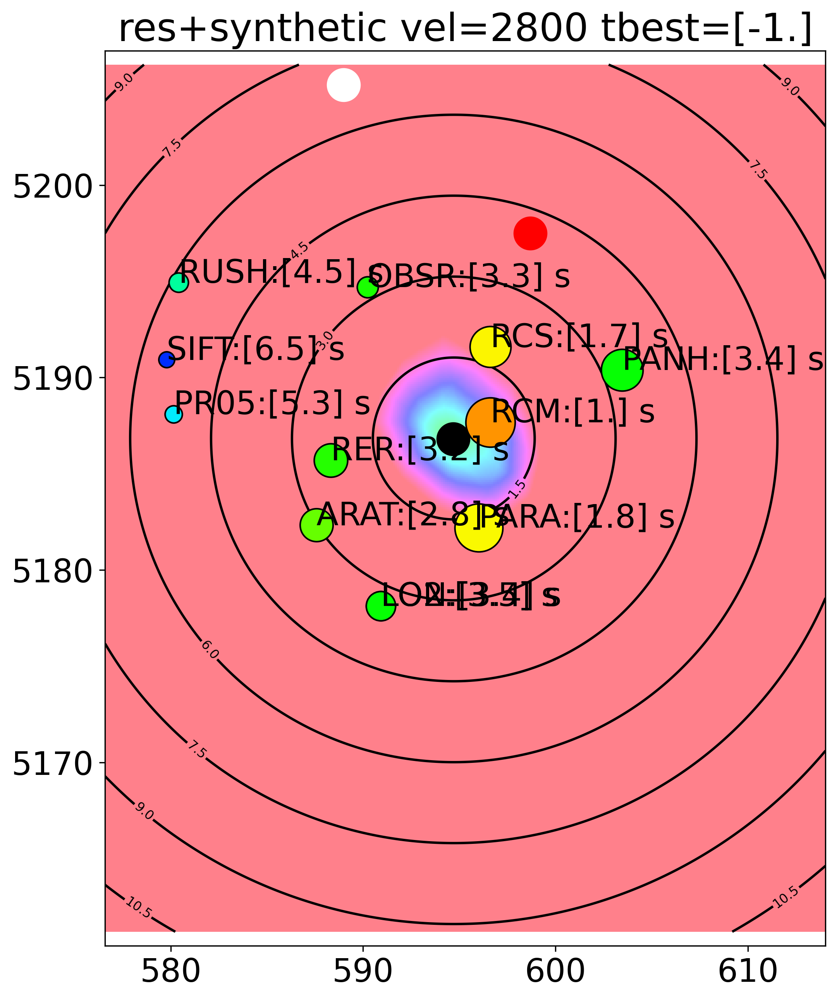

In [ ]:

synthetic_tt = np.zeros((len(x_coords),len(y_coords)))    
for ii in range(len(x_coords)):
        for jj in range(len(y_coords)):
                synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs  
# Existing imshow plot
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=1,alpha=0.5)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
plt.clabel(contours, inline=True, fontsize=8)
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=20)
plt.plot(mx_best/1E3,my_best/1E3,'o',color='r',markersize=20)
plt.plot(cx_best/1E3,cy_best/1E3,'o',color='w',markersize=20)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values,markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=10)
plt.title("res+synthetic vel="+str(vs) + ' tbest='+str(t_best))
# # plt.xlim([-122,-121.5]);
plt.savefig("../plots/" + ava+ "_OCM_res.png")

## DEM

We need to reproject the DEM onto our own grid (x_coord, y_coord)s

In [ ]:

import rasterio
from matplotlib.colors import LightSource
from rasterio.warp import transform_bounds,  reproject, Resampling , calculate_default_transform
from rasterio.transform import array_bounds

In [ ]:
associated_volcano = 'Mt_Rainier'
        
#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()


In [ ]:
# center latitude, center longitude, elevation(m), left_trim, right_trim, bottom_trim, top_trim 
volc_lat_lon = {}
volc_lat_lon['Mt_Rainier'] = [46.8528857, -121.7603744, 4392.5]
#Find the lower left corner and grid size based on volcano elevation
# define grid origin in lat,lon and grid dimensions in m
lon_start = -121.9 #volc_lat_lon[associated_volcano][0]
lon_end = -121.65 #volc_lat_lon[associated_volcano][0]
lat_start = 46.6 #volc_lat_lon[associated_volcano][1]
lat_end = 47 #volc_lat_lon[associated_volcano][1]


# Create a light source
ls = LightSource(azdeg=315, altdeg=45)


# Load the DEM with rasterio
with rasterio.open('../data/geospatial/Mt_Rainier/Mt_Rainier.tif') as src:
    dem = src.read(1)  # read the first band
    transform = src.transform
    bounds = src.bounds
    crs=src.crs
    # dem = dem.astype('float64')
    dem[dem == -32767] = np.nan #gets rid of edge effects
    # dem = np.nan_to_num(dem,nan=1000)


# Define the target CRS
epsg_code = 32600 + 10
# dst_crs = 'EPSG:4326'  # EPSG:4326 is the code for WGS84 lat/lon
dst_crs = 'epsg:{}'.format(epsg_code) #pyproj.Proj(init=)
# Calculate the transform and dimensions for the reprojected DEM
transform_latlon, width, height = calculate_default_transform(crs, dst_crs, dem.shape[1], dem.shape[0], *bounds)


# Create an empty array for the reprojected DEM
dem_latlon = np.empty(shape=(height, width))

# Reproject the DEM
reproject(
    source=dem,
    destination=dem_latlon,
    src_transform=transform,
    src_crs=crs,
    dst_transform=transform_latlon,
    dst_crs=dst_crs,
    resampling=Resampling.nearest)

# Transform the bounds to the target CRS
left, bottom, right, top = transform_bounds(crs, dst_crs, *bounds)

# Calculate the illumination intensity
illumination = ls.hillshade(dem_latlon)
# new bounds
left, bottom, right, top = array_bounds(height, width, transform_latlon)

## Doppler effects?

/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/899612614.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks_new );
/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/899612614.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks_new );


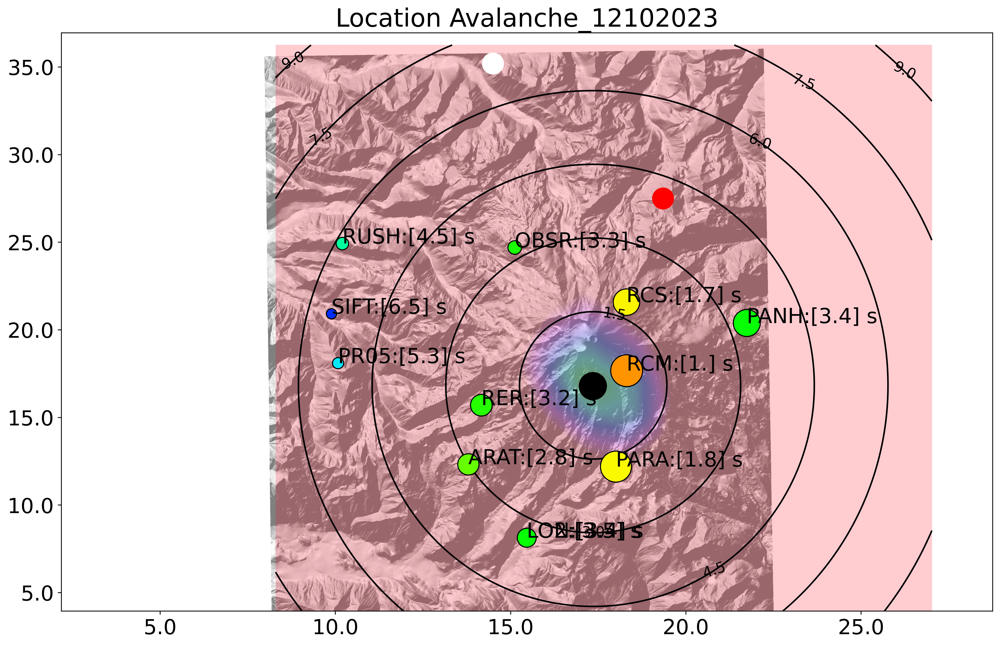

In [ ]:


fig, ax = plt.subplots(figsize=(16, 10), dpi=400)

# find the right UTM zone for the data
def get_utm_zone(longitude):
    return int((longitude + 180) / 6) + 1
utm_zone = get_utm_zone(np.mean(sta_lons))
# # Define the projection: UTM zone 11 for Washington state
proj = pyproj.Proj(proj='utm', zone=utm_zone, ellps='WGS84')
# Convert lat/long to Cartesian in meters
xsta, ysta = proj(sta_lons, sta_lats)
cmap = plt.get_cmap('hot_r')

plt.imshow(illumination, extent=[left/1E3, right/1E3, bottom/1E3,top/1E3 ], cmap='gray',clim=[0,1],alpha=0.5,aspect='equal');
# plt.imshow(illumination, extent=[lon_start, lon_end, lat_start, lat_end], cmap='gray',\
    # clim=[0,1],alpha=0.5,aspect='equal')

issta=np.argmin(arrivals[ista])
stass=stas[ista[issta]]

# Plot the origin
# plt.plot(lon_best,lat_best,'*',color='r',markersize=20,markeredgecolor='k')

plt.title(str(dff[dff['event_ID']==event_ID]['otime'].values[0])[0:13]+ " Travel time Relative to "+stass);

contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
# im = plt.imshow(np.squeeze(rss_mat[0,:,:].T),extent=[lon_start,lon_end,lat_start,lat_end], cmap='hsv', interpolation='nearest',origin='lower')

# Add contour lines
num_contour_lines = 20  # Change this to the number of contour lines you want
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=1,alpha=0.2)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black',linewidths=0.1)
plt.clabel(contours, inline=True, fontsize=14)
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=20)
plt.plot(mx_best/1E3,my_best/1E3,'o',color='r',markersize=20)
plt.plot(cx_best/1E3,cy_best/1E3,'o',color='w',markersize=20)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values,markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=26)

# Get the current xticks and yticks
xticks = ax.get_xticks()
yticks = ax.get_yticks()

# Calculate the bottom left corner coordinates
bottom_left_x = left/1E3
bottom_left_y = bottom/1E3

# Calculate the range of x and y
x_range = right/1E3 - left/1E3
y_range = top/1E3 - bottom/1E3

# Create new xticks and yticks every 5 km
xticks_new = np.arange(0, x_range, 5)
yticks_new = np.arange(0, y_range, 5)
# # Set the new xticks and yticks labels
# ax.set_xticks(xticks_new)
# ax.set_yticks(yticks_new)
plt.xlim([10+bottom_left_x,20+bottom_left_x])
plt.ylim([10+bottom_left_y,43+bottom_left_y])
ax.set_xticklabels(xticks_new );
ax.set_yticklabels(yticks_new );
plt.title("Location "+ava);
plt.savefig("../plots/" + ava+ "_location.png")

[0.24202203 7.05540591 3.63645863]


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/191792224.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  source_location_rad = (math.radians(source_location[0]), math.radians(source_location[1]))


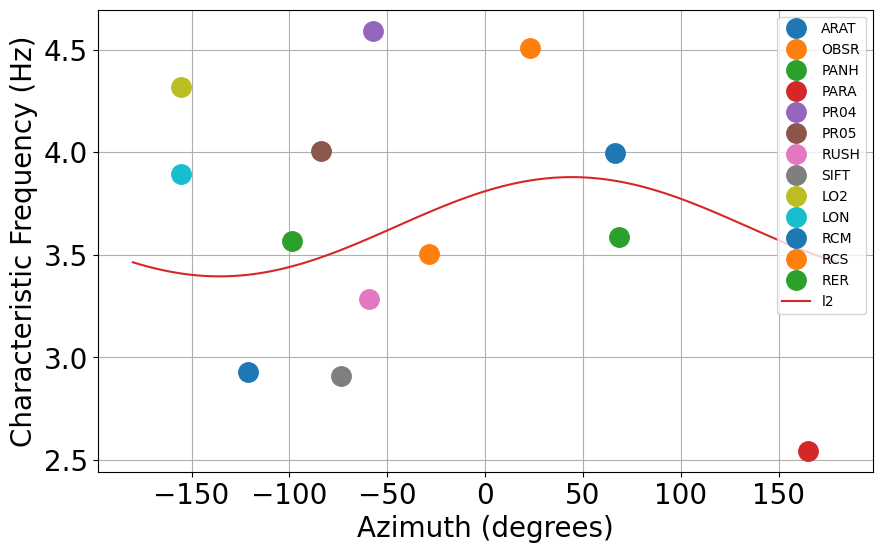

In [ ]:
import matplotlib.pyplot as plt
import math
# Calculate the azimuth between the stations and the source location
def calculate_azimuth(row):
    station_location = (math.radians(row['lats']), math.radians(row['lons']))
    source_location_rad = (math.radians(source_location[0]), math.radians(source_location[1]))
    
    delta_lon = station_location[1] - source_location_rad[1]
    
    numerator = math.sin(delta_lon) * math.cos(station_location[0])
    denominator = math.cos(source_location_rad[0]) * math.sin(station_location[0]) - math.sin(source_location_rad[0]) * math.cos(station_location[0]) * math.cos(delta_lon)
    
    azimuth = math.atan2(numerator, denominator)
    azimuth = math.degrees(azimuth)
     
    # Convert azimuth to range [0, 360]
    # if azimuth < 0:
    #     azimuth += 360
    
    return azimuth
# Assume source_location is a tuple (latitude, longitude)
source_location = (lat_best, lon_best)

# Calculate the azimuth between the stations and the source location
dff['azimuth'] = dff.apply(calculate_azimuth, axis=1)

## Fit a doppler function
# Prepare data
x_data = np.radians(dff['azimuth'].values[ista])
y_data = dff['char_freq'].values[ista]

# Initial guess for the parameters
initial_guess = [0, 2*np.pi,  0]

# Fit the function to the data
params, params_covariance = curve_fit(doppler_func, x_data, y_data, p0=initial_guess)

print(params)

az=np.linspace(-np.pi,np.pi,100)
dop = doppler_func(az,params[0],params[1],params[2])

# Plot the characteristic frequency as a function of azimuth
plt.figure(figsize=(10, 6))
for station in dff['stas'].unique():
    station_data = dff[dff['stas'] == station]
    plt.plot(station_data['azimuth'], station_data['char_freq'],'o',markersize=14, label=station)
plt.plot(np.degrees(az),dop,label='l2')
plt.xlabel('Azimuth (degrees)')
plt.ylabel('Characteristic Frequency (Hz)')
plt.legend(loc='upper right',fontsize=10)
plt.grid(True)
plt.show()

In [ ]:
len(dff['snr'].values[ista])

12

[-0.314041    5.15016203  3.71205019]


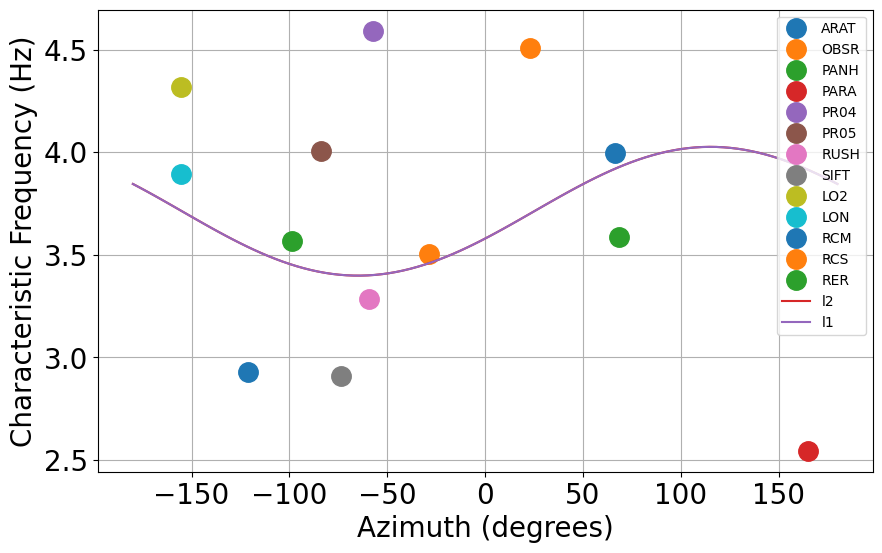

In [ ]:
from scipy.optimize import least_squares

# Define the residuals function
def residuals_func(params, x_data, y_data,weight):
    return (y_data - doppler_func(x_data, *params))*weight

# Initial guess for the parameters
initial_guess = [0, 2*np.pi,  0]

# Fit the function to the data using L1 norm minimization
result = least_squares(residuals_func, initial_guess, args=(x_data, y_data,1/dff['snr'].values[ista]), loss='soft_l1')

# The optimized parameters are stored in result.x
params = result.x

print(params)

az=np.linspace(-np.pi,np.pi,100)
dop = doppler_func(az,params[0],params[1],params[2])


# Fit the function to the data
params, params_covariance = curve_fit(doppler_func, x_data, y_data, p0=initial_guess,sigma=dff['snr'].values[ista])
dop2 = doppler_func(az,params[0],params[1],params[2])

# Plot the characteristic frequency as a function of azimuth
plt.figure(figsize=(10, 6))
for station in dff['stas'].unique():
    station_data = dff[dff['stas'] == station]
    plt.plot(station_data['azimuth'], station_data['char_freq'],'o',markersize=14, label=station)
plt.plot(np.degrees(az),dop,label='l2')
plt.plot(np.degrees(az),dop2,label='l1')
plt.xlabel('Azimuth (degrees)')
plt.ylabel('Characteristic Frequency (Hz)')
plt.legend(loc='upper right',fontsize=10)
plt.grid(True)
plt.show()

In [ ]:
if params[0]<0:
    direction = params[1]+np.pi 
else:
    direction = params[1]   
fmax = max(dop)
fmin = min(dop)
v = vs*((fmax-fmin)/(fmax+fmin))
print(direction,v)


8.291807929594636 236.8443024967627


In [ ]:
dff['flow_dir'] = direction
dff['flow_speed'] = v

## Distance and magnitude


Follow the relation from Lin et al, 2015:
$ Lm = \log(A)+0.55 \log(dist) + 2.44$

where $A$ is in micrometers (1E-6 meters) and $dist$ is in km.

In [ ]:
dff['xsta']=xsta
dff['ysta']=ysta
dff['xbest']=x_best*np.ones(len(xsta))
dff['ybest']=y_best*np.ones(len(xsta))

evlon,evlat = proj(x_best,y_best,inverse=True)
dff['evlat']=evlat*np.ones(len(xsta))
dff['evlon']=evlon*np.ones(len(xsta))

dist=[]
for ista in range(len(xsta)):
    crap=np.sqrt( (xsta[ista] - x_best)**2 + (ysta[ista] - y_best)**2)
    dist.append(crap[0])

dff['dist']=dist
dff.to_csv("../data/located_surface_events.csv",index=False)

In [ ]:
crap = np.zeros(len(xsta))
crap2 = np.zeros(len(xsta))
for ista in range(len(xsta)):
    A = dff['MaxD'].values[ista]*1E6
    A2 = dff['MaxEnv'].values[ista]*1E6
    d = dff['dist'].values[ista]/1E3
    crap[ista]=  np.log(A) + 0.55*np.log(d)+2.44
    crap2[ista]=  np.log(A2) + 0.55*np.log(d)+2.44

dff['Lm_sta_D']=crap
dff['Lm_evt_D'] = np.median(crap)
dff['Lm_sta_Env']=crap2
dff['Lm_evt_Env'] = np.median(crap2)


dff.to_csv("../data/located_surface_events.csv",index=False)